In [1]:
import pandas as pd
from methods import *
import numpy as np
from sklearn.linear_model import LinearRegression
from patsy import cr
import matplotlib.pyplot as plt

In [2]:
# 15 - 24
chile1 = pd.read_csv('data2/peru_15.5_282.5.csv')
chile2 = pd.read_csv('data2/peru_17.5_284.5.csv')
chile3 = pd.read_csv('data2/peru_21.5_288.5.csv')
# 24 - 36
chile4 = pd.read_csv('data2/peru_24.5_285.5.csv')
chile5 = pd.read_csv('data2/peru_26.5_285.5.csv')
chile6 = pd.read_csv('data2/peru_28.5_285.5.csv')
chile7 = pd.read_csv('data2/peru_31.5_285.5.csv')
chile8 = pd.read_csv('data2/peru_33.5_285.5.csv')
# 36 -
chile9 = pd.read_csv('data2/peru_39.5_282.5.csv')
chile10 = pd.read_csv('data2/peru_41.5_282.5.csv')
chile11 = pd.read_csv('data2/peru_44.5_282.5.csv')

In [3]:
chile1 = chile1.dropna().reset_index(drop=True)
chile2 = chile2.dropna().reset_index(drop=True)
chile3 = chile3.dropna().reset_index(drop=True)
chile4 = chile4.dropna().reset_index(drop=True)
chile5 = chile5.dropna().reset_index(drop=True)
chile6 = chile6.dropna().reset_index(drop=True)
chile6 = chile6.dropna().reset_index(drop=True)
chile7 = chile7.dropna().reset_index(drop=True)
chile8 = chile8.dropna().reset_index(drop=True)
chile9 = chile9.dropna().reset_index(drop=True)
chile10 = chile10.dropna().reset_index(drop=True)
chile11 = chile11.dropna().reset_index(drop=True)

In [4]:
coast_angle = [135, 140, 200, 205, 205, 205, 205, 205, 210, 210, 210]
chile_data = [chile1, chile2, chile3, chile4, chile5, chile6, chile7, chile8, chile9, chile10, chile11]

In [5]:
for j, data in enumerate(chile_data):
    upwelling_index = ["kg"]

    for i in range(len(data.index)):
        if not i == 0: 
            ektrx = float(data.loc[[i]]['ektrx'])
            ektry = float(data.loc[[i]]['ektry'])
            # print(ektrx)
            # print(ektry)
            # print(upwell(ektrx, ektry, coast_angle))
            upwelling_index.append(upwell(ektrx, ektry, coast_angle[j]))
    
    data['Upwelling'] = upwelling_index

In [6]:
upwelling_data_1 = normalize(chile1['Upwelling'][1:])
upwelling_data_2 = normalize(chile2['Upwelling'][1:])
upwelling_data_3 = normalize(chile3['Upwelling'][1:])
upwelling_data_4 = normalize(chile4['Upwelling'][1:])
upwelling_data_5 = normalize(chile5['Upwelling'][1:])
upwelling_data_6 = normalize(chile6['Upwelling'][1:])
upwelling_data_7 = normalize(chile7['Upwelling'][1:])
upwelling_data_8 = normalize(chile8['Upwelling'][1:])
upwelling_data_9 = normalize(chile9['Upwelling'][1:])
upwelling_data_10 = normalize(chile10['Upwelling'][1:])
upwelling_data_11 = normalize(chile11['Upwelling'][1:])

In [7]:
N = len(upwelling_data_1)
t0=1981
dt=1/12
time = np.arange(0, N) * dt + t0

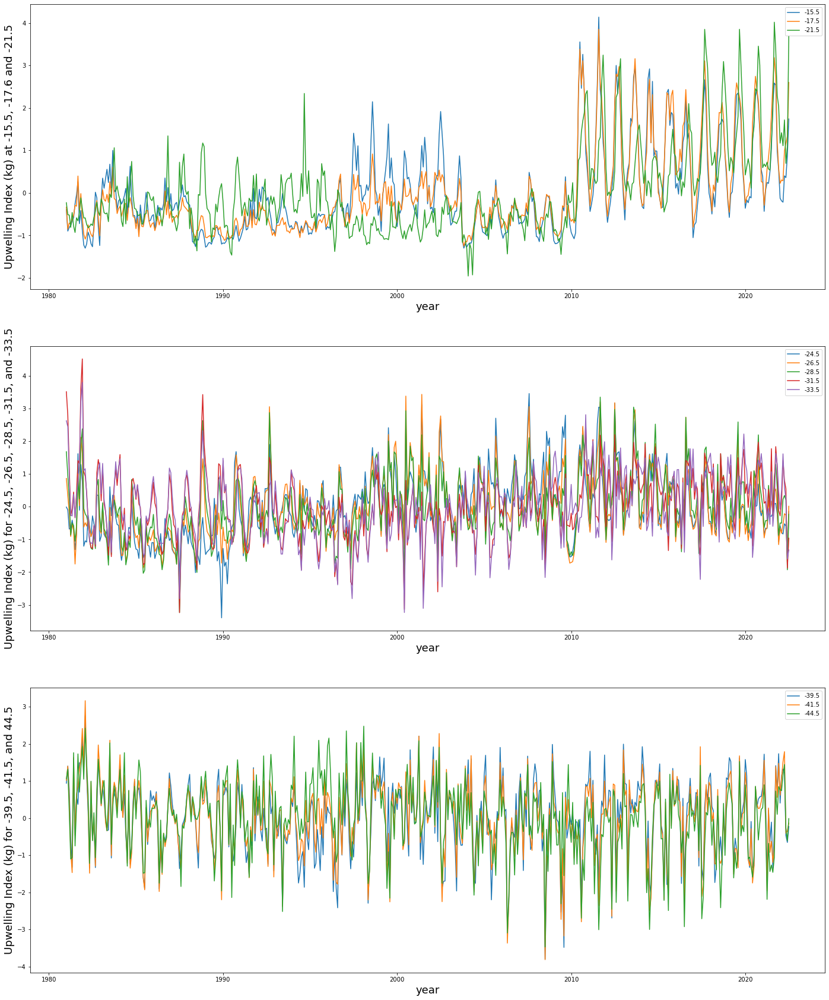

In [8]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(24, 30))


ax1.plot(time, upwelling_data_1, label = "-15.5")
ax1.plot(time, upwelling_data_2, label = "-17.5")
ax1.plot(time, upwelling_data_3, label = "-21.5")
ax1.set_xlabel('year', fontsize = 18)
ax1.set_ylabel('Upwelling Index (kg) at -15.5, -17.6 and -21.5', fontsize=18)
ax1.legend()

ax2.plot(time, upwelling_data_4, label = "-24.5")
ax2.plot(time, upwelling_data_5, label = "-26.5")
ax2.plot(time, upwelling_data_6, label = "-28.5")
ax2.plot(time, upwelling_data_7, label = "-31.5")
ax2.plot(time, upwelling_data_8, label = "-33.5")
ax2.set_xlabel('year', fontsize = 18)
ax2.set_ylabel('Upwelling Index (kg) for -24.5, -26.5, -28.5, -31.5, and -33.5', fontsize=18)
ax2.legend()

ax3.plot(time, upwelling_data_9, label = "-39.5")
ax3.plot(time, upwelling_data_10, label = "-41.5")
ax3.plot(time, upwelling_data_11, label = "-44.5")
ax3.set_xlabel('year', fontsize = 18)
ax3.set_ylabel('Upwelling Index (kg) for -39.5, -41.5, and 44.5', fontsize=18)
ax3.legend()

plt.show()

/Users/chenxuweiyi/Desktop/NOAA/methods.py:87: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar_ax = fig.add_axes([0.95, 0.5, 0.03, 0.25])


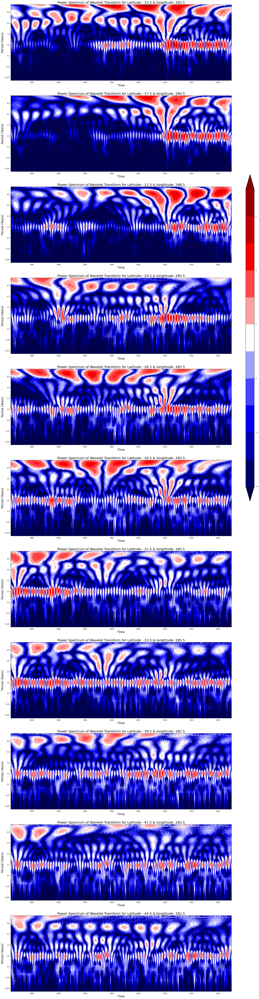

In [18]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11) = plt.subplots(11, 1, figsize=(24, 110))

wavelet_transform_pipeline(fig, ax1, upwelling_data_1.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -15.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax2, upwelling_data_2.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -17.5 & longtitude: 284.5')
wavelet_transform_pipeline(fig, ax3, upwelling_data_3.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -21.5 & longtitude: 288.5')
wavelet_transform_pipeline(fig, ax4, upwelling_data_4.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -24.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax5, upwelling_data_5.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -26.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax6, upwelling_data_6.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -28.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax7, upwelling_data_7.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -31.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax8, upwelling_data_8.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -33.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax9, upwelling_data_9.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -39.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax10, upwelling_data_10.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -41.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax11, upwelling_data_11.to_numpy(), 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -44.5 & longtitude: 282.5')

plt.show()

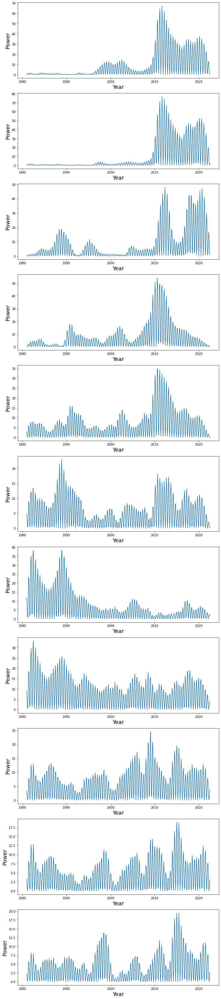

In [24]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11) = plt.subplots(11, 1, figsize=(12, 60))

extract_target_data(ax1, upwelling_data_1, 128, 'morl', 1, 1/12)
extract_target_data(ax2, upwelling_data_2, 128, 'morl', 1, 1/12)
extract_target_data(ax3, upwelling_data_3, 128, 'morl', 1, 1/12)
extract_target_data(ax4, upwelling_data_4, 128, 'morl', 1, 1/12)
extract_target_data(ax5, upwelling_data_5, 128, 'morl', 1, 1/12)
extract_target_data(ax6, upwelling_data_6, 128, 'morl', 1, 1/12)
extract_target_data(ax7, upwelling_data_7, 128, 'morl', 1, 1/12)
extract_target_data(ax8, upwelling_data_8, 128, 'morl', 1, 1/12)
extract_target_data(ax9, upwelling_data_9, 128, 'morl', 1, 1/12)
extract_target_data(ax10, upwelling_data_10, 128, 'morl', 1, 1/12)
extract_target_data(ax11, upwelling_data_11, 128, 'morl', 1, 1/12)

plt.show()

## Spline 3-degree

In [20]:
upwelling_data_1 = detred_spline_smoothing(time, chile1['Upwelling'][1:].to_numpy(), 3)
upwelling_data_2 = detred_spline_smoothing(time, chile2['Upwelling'][1:].to_numpy(), 3)
upwelling_data_3 = detred_spline_smoothing(time, chile3['Upwelling'][1:].to_numpy(), 3)
upwelling_data_4 = detred_spline_smoothing(time, chile4['Upwelling'][1:].to_numpy(), 3)
upwelling_data_5 = detred_spline_smoothing(time, chile5['Upwelling'][1:].to_numpy(), 3)
upwelling_data_6 = detred_spline_smoothing(time, chile6['Upwelling'][1:].to_numpy(), 3)
upwelling_data_7 = detred_spline_smoothing(time, chile7['Upwelling'][1:].to_numpy(), 3)
upwelling_data_8 = detred_spline_smoothing(time, chile8['Upwelling'][1:].to_numpy(), 3)
upwelling_data_9 = detred_spline_smoothing(time, chile9['Upwelling'][1:].to_numpy(), 3)
upwelling_data_10 = detred_spline_smoothing(time, chile10['Upwelling'][1:].to_numpy(), 3)
upwelling_data_11 = detred_spline_smoothing(time, chile11['Upwelling'][1:].to_numpy(), 3)

upwelling_data_1 = normalize(upwelling_data_1)
upwelling_data_2 = normalize(upwelling_data_2)
upwelling_data_3 = normalize(upwelling_data_3)
upwelling_data_4 = normalize(upwelling_data_4)
upwelling_data_5 = normalize(upwelling_data_5)
upwelling_data_6 = normalize(upwelling_data_6)
upwelling_data_7 = normalize(upwelling_data_7)
upwelling_data_8 = normalize(upwelling_data_8)
upwelling_data_9 = normalize(upwelling_data_9)
upwelling_data_10 = normalize(upwelling_data_10)
upwelling_data_11 = normalize(upwelling_data_11)

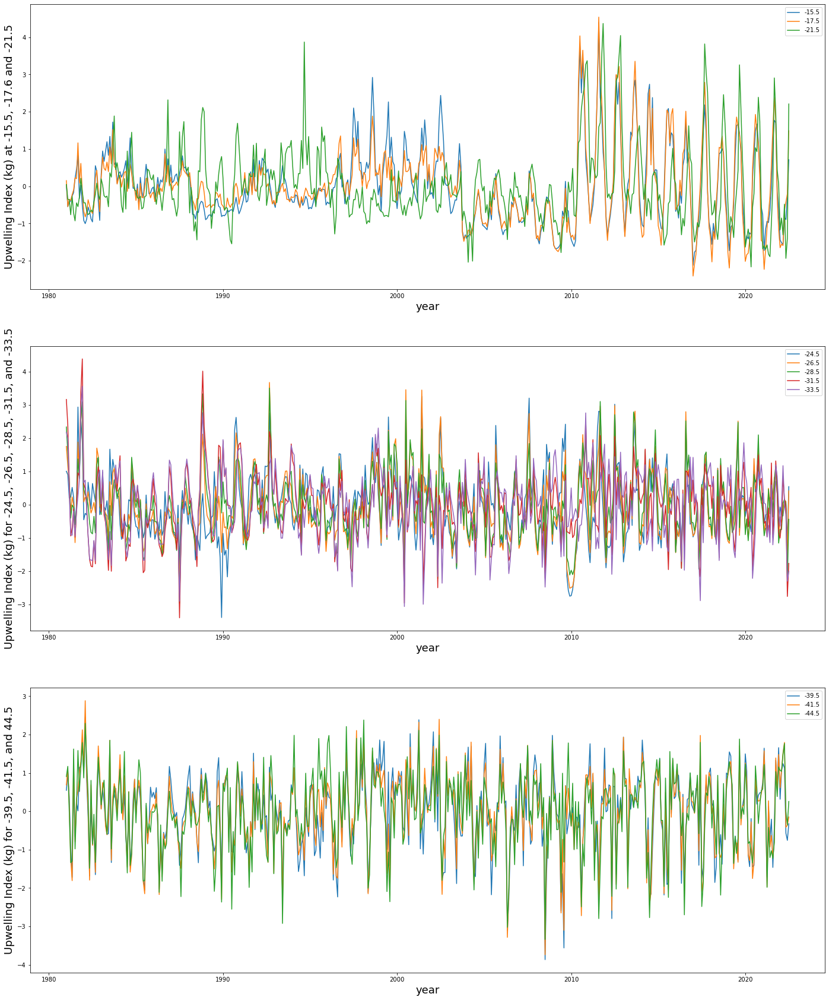

In [21]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(24, 30))


ax1.plot(time, upwelling_data_1, label = "-15.5")
ax1.plot(time, upwelling_data_2, label = "-17.5")
ax1.plot(time, upwelling_data_3, label = "-21.5")
ax1.set_xlabel('year', fontsize = 18)
ax1.set_ylabel('Upwelling Index (kg) at -15.5, -17.6 and -21.5', fontsize=18)
ax1.legend()

ax2.plot(time, upwelling_data_4, label = "-24.5")
ax2.plot(time, upwelling_data_5, label = "-26.5")
ax2.plot(time, upwelling_data_6, label = "-28.5")
ax2.plot(time, upwelling_data_7, label = "-31.5")
ax2.plot(time, upwelling_data_8, label = "-33.5")
ax2.set_xlabel('year', fontsize = 18)
ax2.set_ylabel('Upwelling Index (kg) for -24.5, -26.5, -28.5, -31.5, and -33.5', fontsize=18)
ax2.legend()

ax3.plot(time, upwelling_data_9, label = "-39.5")
ax3.plot(time, upwelling_data_10, label = "-41.5")
ax3.plot(time, upwelling_data_11, label = "-44.5")
ax3.set_xlabel('year', fontsize = 18)
ax3.set_ylabel('Upwelling Index (kg) for -39.5, -41.5, and 44.5', fontsize=18)
ax3.legend()

plt.show()

/Users/chenxuweiyi/Desktop/NOAA/methods.py:87: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar_ax = fig.add_axes([0.95, 0.5, 0.03, 0.25])


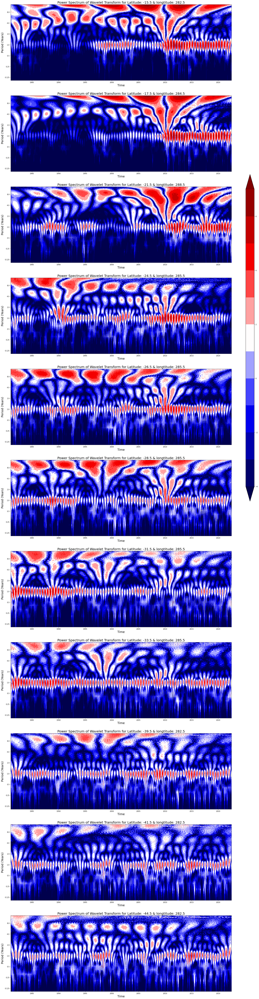

In [23]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11) = plt.subplots(11, 1, figsize=(24, 110))

wavelet_transform_pipeline(fig, ax1, upwelling_data_1, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -15.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax2, upwelling_data_2, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -17.5 & longtitude: 284.5')
wavelet_transform_pipeline(fig, ax3, upwelling_data_3, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -21.5 & longtitude: 288.5')
wavelet_transform_pipeline(fig, ax4, upwelling_data_4, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -24.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax5, upwelling_data_5, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -26.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax6, upwelling_data_6, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -28.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax7, upwelling_data_7, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -31.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax8, upwelling_data_8, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -33.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax9, upwelling_data_9, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -39.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax10, upwelling_data_10, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -41.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax11, upwelling_data_11, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -44.5 & longtitude: 282.5')

plt.show()

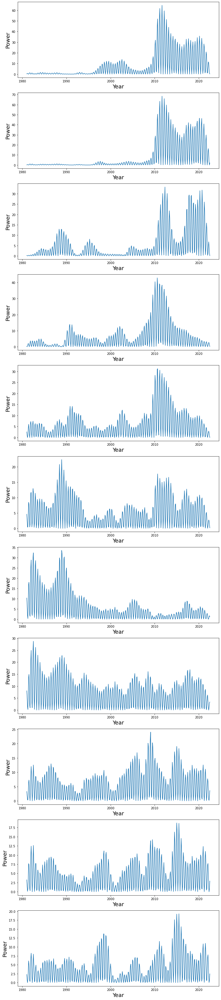

In [28]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11) = plt.subplots(11, 1, figsize=(12, 60))

extract_target_data(ax1, upwelling_data_1, 128, 'morl', 1, 1/12)
extract_target_data(ax2, upwelling_data_2, 128, 'morl', 1, 1/12)
extract_target_data(ax3, upwelling_data_3, 128, 'morl', 1, 1/12)
extract_target_data(ax4, upwelling_data_4, 128, 'morl', 1, 1/12)
extract_target_data(ax5, upwelling_data_5, 128, 'morl', 1, 1/12)
extract_target_data(ax6, upwelling_data_6, 128, 'morl', 1, 1/12)
extract_target_data(ax7, upwelling_data_7, 128, 'morl', 1, 1/12)
extract_target_data(ax8, upwelling_data_8, 128, 'morl', 1, 1/12)
extract_target_data(ax9, upwelling_data_9, 128, 'morl', 1, 1/12)
extract_target_data(ax10, upwelling_data_10, 128, 'morl', 1, 1/12)
extract_target_data(ax11, upwelling_data_11, 128, 'morl', 1, 1/12)

plt.show()

## Linear Regression Detrend

In [26]:
upwelling_data_1 = detrend_linear_reg(chile1['Upwelling'][1:].to_numpy())
upwelling_data_2 = detrend_linear_reg(chile2['Upwelling'][1:].to_numpy())
upwelling_data_3 = detrend_linear_reg(chile3['Upwelling'][1:].to_numpy())
upwelling_data_4 = detrend_linear_reg(chile4['Upwelling'][1:].to_numpy())
upwelling_data_5 = detrend_linear_reg(chile5['Upwelling'][1:].to_numpy())
upwelling_data_6 = detrend_linear_reg(chile6['Upwelling'][1:].to_numpy())
upwelling_data_7 = detrend_linear_reg(chile7['Upwelling'][1:].to_numpy())
upwelling_data_8 = detrend_linear_reg(chile8['Upwelling'][1:].to_numpy())
upwelling_data_9 = detrend_linear_reg(chile9['Upwelling'][1:].to_numpy())
upwelling_data_10 = detrend_linear_reg(chile10['Upwelling'][1:].to_numpy())
upwelling_data_11 = detrend_linear_reg(chile11['Upwelling'][1:].to_numpy())

upwelling_data_1 = normalize(upwelling_data_1)
upwelling_data_2 = normalize(upwelling_data_2)
upwelling_data_3 = normalize(upwelling_data_3)
upwelling_data_4 = normalize(upwelling_data_4)
upwelling_data_5 = normalize(upwelling_data_5)
upwelling_data_6 = normalize(upwelling_data_6)
upwelling_data_7 = normalize(upwelling_data_7)
upwelling_data_8 = normalize(upwelling_data_8)
upwelling_data_9 = normalize(upwelling_data_9)
upwelling_data_10 = normalize(upwelling_data_10)
upwelling_data_11 = normalize(upwelling_data_11)

global trend:  [0.69495351]
global trend:  [0.64828242]
global trend:  [0.50510574]
global trend:  [0.05141406]
global trend:  [0.05314334]
global trend:  [0.08235469]
global trend:  [0.06196924]
global trend:  [0.06412974]
global trend:  [0.0009196]
global trend:  [-0.01466811]
global trend:  [-0.05163849]


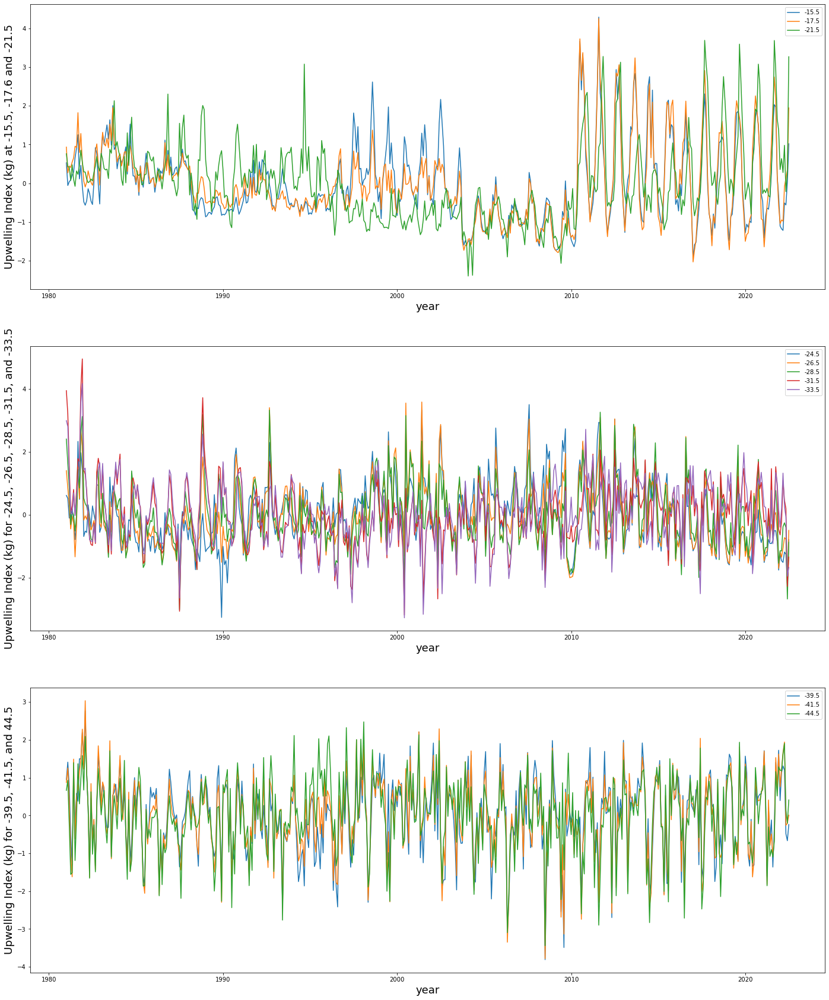

In [27]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(24, 30))


ax1.plot(time, upwelling_data_1, label = "-15.5")
ax1.plot(time, upwelling_data_2, label = "-17.5")
ax1.plot(time, upwelling_data_3, label = "-21.5")
ax1.set_xlabel('year', fontsize = 18)
ax1.set_ylabel('Upwelling Index (kg) at -15.5, -17.6 and -21.5', fontsize=18)
ax1.legend()

ax2.plot(time, upwelling_data_4, label = "-24.5")
ax2.plot(time, upwelling_data_5, label = "-26.5")
ax2.plot(time, upwelling_data_6, label = "-28.5")
ax2.plot(time, upwelling_data_7, label = "-31.5")
ax2.plot(time, upwelling_data_8, label = "-33.5")
ax2.set_xlabel('year', fontsize = 18)
ax2.set_ylabel('Upwelling Index (kg) for -24.5, -26.5, -28.5, -31.5, and -33.5', fontsize=18)
ax2.legend()

ax3.plot(time, upwelling_data_9, label = "-39.5")
ax3.plot(time, upwelling_data_10, label = "-41.5")
ax3.plot(time, upwelling_data_11, label = "-44.5")
ax3.set_xlabel('year', fontsize = 18)
ax3.set_ylabel('Upwelling Index (kg) for -39.5, -41.5, and 44.5', fontsize=18)
ax3.legend()

plt.show()

/Users/chenxuweiyi/Desktop/NOAA/methods.py:87: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar_ax = fig.add_axes([0.95, 0.5, 0.03, 0.25])


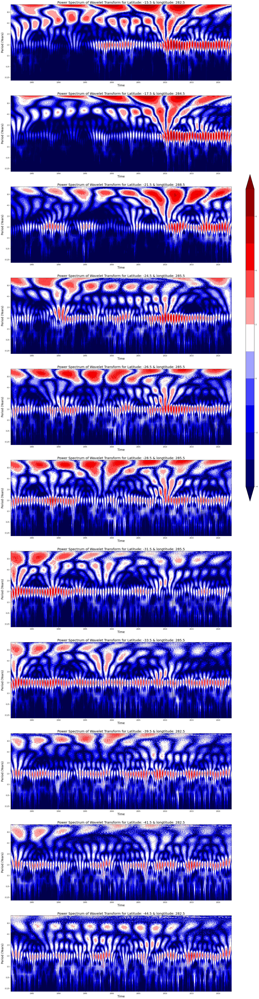

In [29]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11) = plt.subplots(11, 1, figsize=(24, 110))

wavelet_transform_pipeline(fig, ax1, upwelling_data_1, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -15.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax2, upwelling_data_2, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -17.5 & longtitude: 284.5')
wavelet_transform_pipeline(fig, ax3, upwelling_data_3, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -21.5 & longtitude: 288.5')
wavelet_transform_pipeline(fig, ax4, upwelling_data_4, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -24.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax5, upwelling_data_5, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -26.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax6, upwelling_data_6, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -28.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax7, upwelling_data_7, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -31.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax8, upwelling_data_8, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -33.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax9, upwelling_data_9, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -39.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax10, upwelling_data_10, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -41.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax11, upwelling_data_11, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -44.5 & longtitude: 282.5')

plt.show()

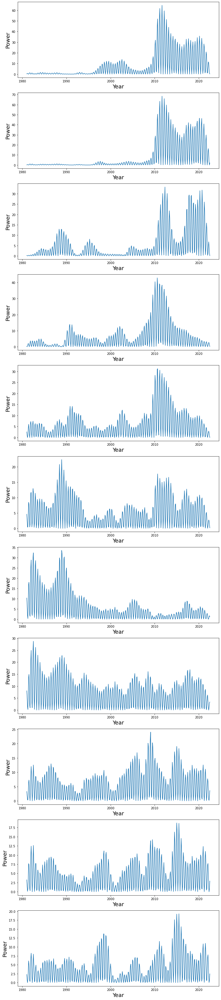

In [30]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11) = plt.subplots(11, 1, figsize=(12, 60))

extract_target_data(ax1, upwelling_data_1, 128, 'morl', 1, 1/12)
extract_target_data(ax2, upwelling_data_2, 128, 'morl', 1, 1/12)
extract_target_data(ax3, upwelling_data_3, 128, 'morl', 1, 1/12)
extract_target_data(ax4, upwelling_data_4, 128, 'morl', 1, 1/12)
extract_target_data(ax5, upwelling_data_5, 128, 'morl', 1, 1/12)
extract_target_data(ax6, upwelling_data_6, 128, 'morl', 1, 1/12)
extract_target_data(ax7, upwelling_data_7, 128, 'morl', 1, 1/12)
extract_target_data(ax8, upwelling_data_8, 128, 'morl', 1, 1/12)
extract_target_data(ax9, upwelling_data_9, 128, 'morl', 1, 1/12)
extract_target_data(ax10, upwelling_data_10, 128, 'morl', 1, 1/12)
extract_target_data(ax11, upwelling_data_11, 128, 'morl', 1, 1/12)

plt.show()

## Detrend by Differencing

In [40]:
upwelling_data_1 = detrend_differencing(chile1['Upwelling'][1:].to_numpy())
upwelling_data_2 = detrend_differencing(chile2['Upwelling'][1:].to_numpy())
upwelling_data_3 = detrend_differencing(chile3['Upwelling'][1:].to_numpy())
upwelling_data_4 = detrend_differencing(chile4['Upwelling'][1:].to_numpy())
upwelling_data_5 = detrend_differencing(chile5['Upwelling'][1:].to_numpy())
upwelling_data_6 = detrend_differencing(chile6['Upwelling'][1:].to_numpy())
upwelling_data_7 = detrend_differencing(chile7['Upwelling'][1:].to_numpy())
upwelling_data_8 = detrend_differencing(chile8['Upwelling'][1:].to_numpy())
upwelling_data_9 = detrend_differencing(chile9['Upwelling'][1:].to_numpy())
upwelling_data_10 = detrend_differencing(chile10['Upwelling'][1:].to_numpy())
upwelling_data_11 = detrend_differencing(chile11['Upwelling'][1:].to_numpy())

upwelling_data_1 = normalize(upwelling_data_1)
upwelling_data_2 = normalize(upwelling_data_2)
upwelling_data_3 = normalize(upwelling_data_3)
upwelling_data_4 = normalize(upwelling_data_4)
upwelling_data_5 = normalize(upwelling_data_5)
upwelling_data_6 = normalize(upwelling_data_6)
upwelling_data_7 = normalize(upwelling_data_7)
upwelling_data_8 = normalize(upwelling_data_8)
upwelling_data_9 = normalize(upwelling_data_9)
upwelling_data_10 = normalize(upwelling_data_10)
upwelling_data_11 = normalize(upwelling_data_11)

In [42]:
N = len(upwelling_data_1)
t0=1981
dt=1/12
time = np.arange(0, N) * dt + t0 + dt

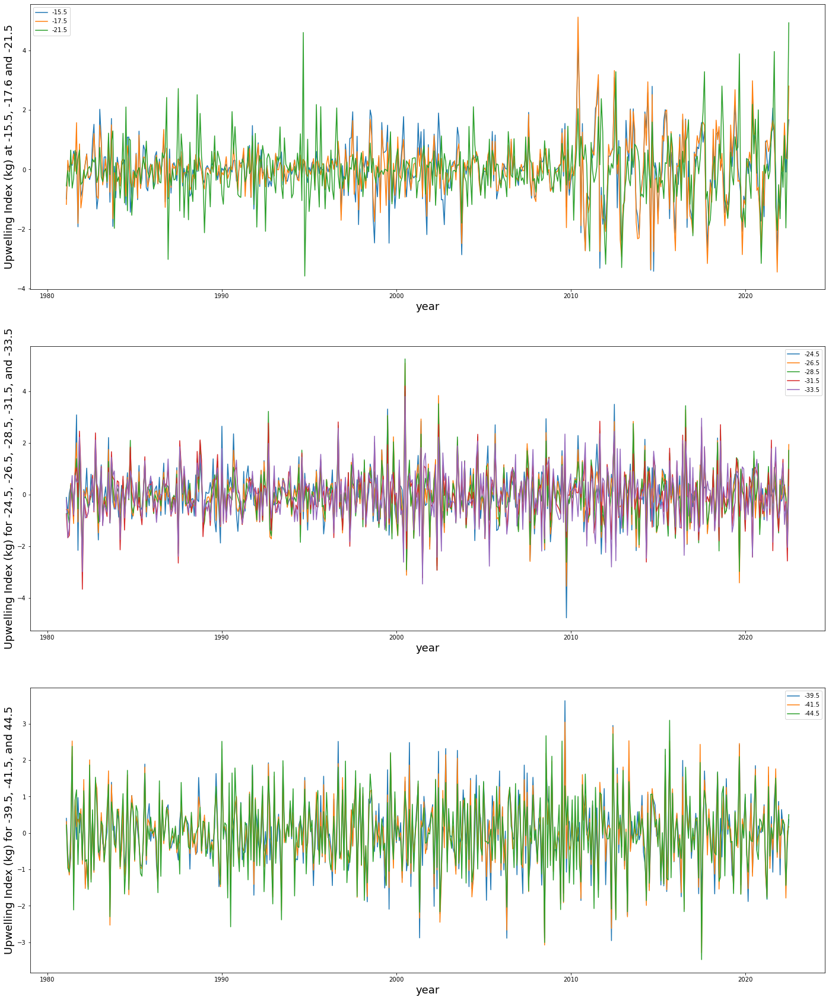

In [44]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(24, 30))


ax1.plot(time, upwelling_data_1, label = "-15.5")
ax1.plot(time, upwelling_data_2, label = "-17.5")
ax1.plot(time, upwelling_data_3, label = "-21.5")
ax1.set_xlabel('year', fontsize = 18)
ax1.set_ylabel('Upwelling Index (kg) at -15.5, -17.6 and -21.5', fontsize=18)
ax1.legend()

ax2.plot(time, upwelling_data_4, label = "-24.5")
ax2.plot(time, upwelling_data_5, label = "-26.5")
ax2.plot(time, upwelling_data_6, label = "-28.5")
ax2.plot(time, upwelling_data_7, label = "-31.5")
ax2.plot(time, upwelling_data_8, label = "-33.5")
ax2.set_xlabel('year', fontsize = 18)
ax2.set_ylabel('Upwelling Index (kg) for -24.5, -26.5, -28.5, -31.5, and -33.5', fontsize=18)
ax2.legend()

ax3.plot(time, upwelling_data_9, label = "-39.5")
ax3.plot(time, upwelling_data_10, label = "-41.5")
ax3.plot(time, upwelling_data_11, label = "-44.5")
ax3.set_xlabel('year', fontsize = 18)
ax3.set_ylabel('Upwelling Index (kg) for -39.5, -41.5, and 44.5', fontsize=18)
ax3.legend()

plt.show()

/Users/chenxuweiyi/Desktop/NOAA/methods.py:87: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar_ax = fig.add_axes([0.95, 0.5, 0.03, 0.25])


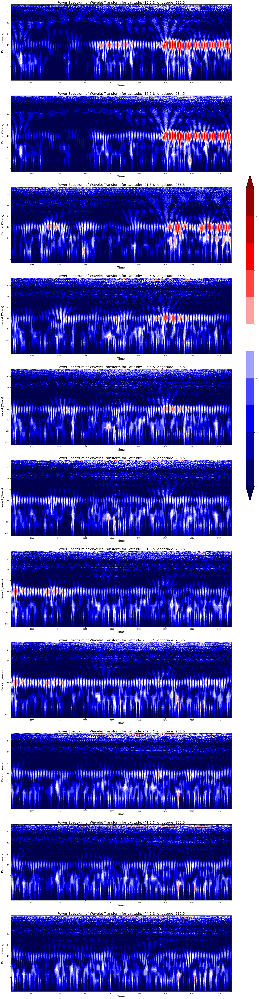

In [45]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11) = plt.subplots(11, 1, figsize=(24, 110))

wavelet_transform_pipeline(fig, ax1, upwelling_data_1, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -15.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax2, upwelling_data_2, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -17.5 & longtitude: 284.5')
wavelet_transform_pipeline(fig, ax3, upwelling_data_3, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -21.5 & longtitude: 288.5')
wavelet_transform_pipeline(fig, ax4, upwelling_data_4, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -24.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax5, upwelling_data_5, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -26.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax6, upwelling_data_6, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -28.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax7, upwelling_data_7, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -31.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax8, upwelling_data_8, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -33.5 & longtitude: 285.5')
wavelet_transform_pipeline(fig, ax9, upwelling_data_9, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -39.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax10, upwelling_data_10, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -41.5 & longtitude: 282.5')
wavelet_transform_pipeline(fig, ax11, upwelling_data_11, 'morl', 128, 1/12, 'Power Spectrum of Wavelet Transform for Latitude: -44.5 & longtitude: 282.5')

plt.show()

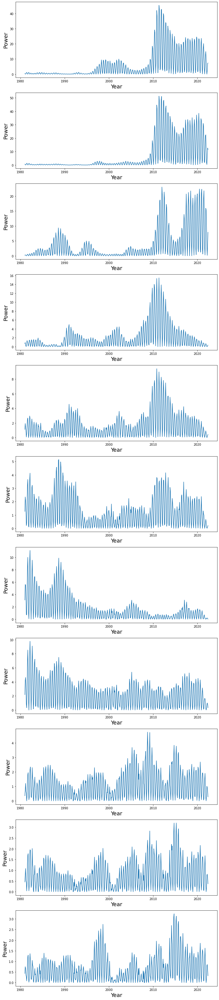

In [46]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11) = plt.subplots(11, 1, figsize=(12, 60))

extract_target_data(ax1, upwelling_data_1, 128, 'morl', 1, 1/12)
extract_target_data(ax2, upwelling_data_2, 128, 'morl', 1, 1/12)
extract_target_data(ax3, upwelling_data_3, 128, 'morl', 1, 1/12)
extract_target_data(ax4, upwelling_data_4, 128, 'morl', 1, 1/12)
extract_target_data(ax5, upwelling_data_5, 128, 'morl', 1, 1/12)
extract_target_data(ax6, upwelling_data_6, 128, 'morl', 1, 1/12)
extract_target_data(ax7, upwelling_data_7, 128, 'morl', 1, 1/12)
extract_target_data(ax8, upwelling_data_8, 128, 'morl', 1, 1/12)
extract_target_data(ax9, upwelling_data_9, 128, 'morl', 1, 1/12)
extract_target_data(ax10, upwelling_data_10, 128, 'morl', 1, 1/12)
extract_target_data(ax11, upwelling_data_11, 128, 'morl', 1, 1/12)

plt.show()